# Capstone Notebook

## Import Libraries

In [1]:
# Libraries for working with data
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import json
import math
import statsmodels.api as sm
from scipy import stats

# Libraries for plotting and visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from dash import Dash, html, dcc, callback, Output, Input
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve

# Libraries for machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

# Set display options
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.reset_option('display.max_rows') # Uncomment this line and rerun cell to prevent full display of dataframes

## Load Data

In [2]:
path = 'CPhoenix UOF Data\\relabeled'
os.chdir(os.path.join(os.getcwd(), path))

In [3]:
files = os.listdir()

uof1 = pd.read_csv(files[0])
uof2 = pd.read_csv(files[1])
off_dem = pd.read_csv(files[2])
sev_1hot = pd.read_csv(files[3])
uof3 = pd.read_csv(files[4])
inc_sum = pd.read_csv(files[5])
ind_sum = pd.read_csv(files[6])
off_sum = pd.read_csv(files[7])
eth_sum = pd.read_csv(files[8])

In [4]:
dfs = [uof1, uof2, uof3, inc_sum, ind_sum, off_sum, eth_sum, off_dem, sev_1hot]

## View Datasets and Columns

In [5]:
# Check nulls

for df in dfs:
    print(df.isna().sum().sum())

0
0
31
0
5974
8
4
1
0


In [6]:
uof1

,Use of Force Report Number,Incident Report Number,Police Employee Unique Identifier,Unique Individual Record Number,Date,Year,Hour,Day of Week,Police Beat,Anonymized Address,...,Use of Force Utilized - Impact Weapons,Use of Force Utilized - Hard Empty Hand,Use of Force Utilized – Direct Impact Munitions,Use of Force Utilized - Conducted Electrical Weapon (CEW),Use of Force Utilized - Irritants,Use of Force Utilized - Pointed Gun at Person,Use of Force Utilized - Tripping / Tackling,Use of Force Utilized - Soft Empty Hand,Use of Force Utilized - Restraining Devices,Use of Force Utilized - Other
0,UOF21-0004,202100000009233,09947,24794,2021-01-02T00:00:00,2021,17,7-SATURDAY,231 Beat,1XXXX North 15th Street,...,0,0,0,0,0,0,0,0,1,0
1,UOF21-0018,202100000010086,R1425,24793,2021-01-02T00:00:00,2021,20,7-SATURDAY,632 Beat,3XXX East Bell Road,...,0,0,0,0,0,0,0,0,1,0
2,UOF21-0018,202100000010086,10402,24793,2021-01-02T00:00:00,2021,20,7-SATURDAY,632 Beat,3XXX East Bell Road,...,0,0,0,0,0,0,0,0,1,0
3,UOF21-0004,202100000009233,10347,24794,2021-01-02T00:00:00,2021,17,7-SATURDAY,231 Beat,1XXXX North 15th Street,...,0,0,0,0,0,0,0,0,1,0
4,UOF21-0013,202100000011222,07553,24772,2021-01-03T00:00:00,2021,1,1-SUNDAY,611 Beat,1XXX West Glendale Avenue,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,RTR23-1443,202300001661876,09366,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,0,0,1,0,0,0,0,0,0,0
4963,RTR23-1443,202300001661876,09902,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,0,0,0,0,0,0,1,0,0,0
4964,RTR23-1319,202300001662882,10628,49272,2023-11-02T00:00:00,2023,18,5-THURSDAY,932 Beat,1XXXX North 28th Avenue,...,0,0,1,0,0,0,0,0,0,0
4965,RTR23-1372,202300001668249,11720,49412,2023-11-03T00:00:00,2023,16,6-FRIDAY,422 Beat,4XXX South 9th Street,...,0,0,0,0,0,0,1,0,0,0


In [7]:
uof2

,Incident Report Number,Police Employee Unique Identifier,Unique Individual Record Number,Date,Year,Hour,Day of Week,Police Beat,Anonymized Address,Police Precinct,...,Use of Force Utilized - Deadly Physical Force,Use of Force Utilized - Canines,Use of Force Utilized - Impact Weapons,Use of Force Utilized - Hard Empty Hand,Use of Force Utilized – Direct Impact Munitions,Use of Force Utilized - Conducted Electrical Weapon (CEW),Use of Force Utilized - Irritants,Use of Force Utilized - Tripping / Tackling,Use of Force Utilized - Soft Empty Hand,Use of Force Utilized - Other
0,201700000602225,07779,46388,2017-04-07T00:00:00,2017,20,6-FRIDAY,512 Beat,5X West Jefferson Street,Central City Precinct,...,0,0,0,1,0,0,0,0,0,0
1,201800000002281,08996,MNI-3295853,2018-01-01T00:00:00,2018,9,2-MONDAY,734 Beat,24XX W THOMAS RD,Mountain View Precinct Precinct,...,0,0,0,0,0,1,0,0,0,0
2,201800000002281,R1190,MNI-3295853,2018-01-01T00:00:00,2018,9,2-MONDAY,734 Beat,24XX W THOMAS RD,Mountain View Precinct Precinct,...,0,0,0,0,0,1,0,0,1,0
3,201800000002889,09942,MNI-3086367,2018-01-01T00:00:00,2018,12,2-MONDAY,224 Beat,20XX W UNION HILLS DR,Black Mountain Precinct Precinct,...,0,0,0,0,0,0,0,0,1,0
4,201800000000821,10068,MNI-100947238,2018-01-01T00:00:00,2018,1,2-MONDAY,726 Beat,3XX N 44TH ST,Mountain View Precinct Precinct,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8624,202300001661876,09366,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,Maryvale/Estrella Precinct,...,0,0,0,0,1,0,0,0,0,0
8625,202300001661876,09902,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,Maryvale/Estrella Precinct,...,0,0,0,0,0,0,0,1,0,0
8626,202300001662882,10628,49272,2023-11-02T00:00:00,2023,18,5-THURSDAY,932 Beat,1XXXX North 28th Avenue,Cactus Park Precinct,...,0,0,0,0,1,0,0,0,0,0
8627,202300001668249,11720,49412,2023-11-03T00:00:00,2023,16,6-FRIDAY,422 Beat,4XXX South 9th Street,South Mountain Precinct,...,0,0,0,0,0,0,0,1,0,0


In [8]:
uof3

,Use of Force Report Number,Incident Report Number,Police Employee Unique Identifier,Unique Individual Record Number,Date,Year,Hour,Day of Week,Police Beat,Anonymized Address,...,Use of Force Utilized - Impact Weapons,Use of Force Utilized - Hard Empty Hand,Use of Force Utilized – Direct Impact Munitions,Use of Force Utilized - Conducted Electrical Weapon (CEW),Use of Force Utilized - Irritants,Use of Force Utilized - Pointed Gun at Person,Use of Force Utilized - Tripping / Tackling,Use of Force Utilized - Soft Empty Hand,Use of Force Utilized - Restraining Devices,Use of Force Utilized - Other
0,RTR23-0895,201700000602225,07779,46388,2017-04-07T00:00:00,2017,20,6-FRIDAY,512 Beat,5X West Jefferson Street,...,No,Yes,No,No,No,No,No,No,No,No
1,Not Available,201800000002281,08996,MNI-3295853,2018-01-01T00:00:00,2018,9,2-MONDAY,734 Beat,24XX W THOMAS RD,...,No,No,No,Yes,No,Not Available,No,No,Not Available,No
2,Not Available,201800000002281,R1190,MNI-3295853,2018-01-01T00:00:00,2018,9,2-MONDAY,734 Beat,24XX W THOMAS RD,...,No,No,No,Yes,No,Not Available,No,Yes,Not Available,No
3,Not Available,201800000002889,09942,MNI-3086367,2018-01-01T00:00:00,2018,12,2-MONDAY,224 Beat,20XX W UNION HILLS DR,...,No,No,No,No,No,Not Available,No,Yes,Not Available,No
4,Not Available,201800000000821,10068,MNI-100947238,2018-01-01T00:00:00,2018,1,2-MONDAY,726 Beat,3XX N 44TH ST,...,No,Yes,No,No,No,Not Available,No,Yes,Not Available,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9188,RTR23-1443,202300001661876,09366,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,No,No,Yes,No,No,No,No,No,No,No
9189,RTR23-1443,202300001661876,09902,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,No,No,No,No,No,No,Yes,No,No,No
9190,RTR23-1319,202300001662882,10628,49272,2023-11-02T00:00:00,2023,18,5-THURSDAY,932 Beat,1XXXX North 28th Avenue,...,No,No,Yes,No,No,No,No,No,No,No
9191,RTR23-1372,202300001668249,11720,49412,2023-11-03T00:00:00,2023,16,6-FRIDAY,422 Beat,4XXX South 9th Street,...,No,No,No,No,No,No,Yes,No,No,No


In [9]:
inc_sum

,Use of Force Category,Incident Date,Year,Police Precinct,Use of Force Count
0,Officers,04/07/2017,2017,Central City Precinct,1
1,Incidents,04/07/2017,2017,Central City Precinct,1
2,Officers,01/01/2018,2018,Black Mountain Precinct Precinct,1
3,Incidents,01/01/2018,2018,Mountain View Precinct Precinct,3
4,Incidents,01/01/2018,2018,Black Mountain Precinct Precinct,1
...,...,...,...,...,...
8943,Incidents,11/02/2023,2023,Cactus Park Precinct,1
8944,Officers,11/03/2023,2023,Desert Horizon Precinct,1
8945,Officers,11/03/2023,2023,South Mountain Precinct,1
8946,Incidents,11/03/2023,2023,South Mountain Precinct,1


In [10]:
ind_sum

,Incident Report Number,Unique Individual Incident Record Number,Date,Year,Subject Gender/Sex,Individual Race / Ethnicity Grouping,Individual Age Grouped,Individual Injury,Highest Level of Arrest Charge,Highest Level of Force Applied,Highest Level of Weapon Type,Highest Level of Resistance,Individual Count
0,201700000602225,20170000060222546388,04/07/2017,2017,Male,Other,30s,Yes,Criminal Felony,Hard Empty Hand Control,NaN,Active Aggression,1
1,201800000002281,201800000002281MNI-3295853,01/01/2018,2018,Male,Other,20s,Not Available,NaN,Direct Impact Munitions,Cutting Instrument,Active Resistance,1
2,201800000000821,201800000000821MNI-100947238,01/01/2018,2018,Male,White,60s,Not Available,NaN,Hard Empty Hand Control,NaN,Active Aggression,1
3,201800000001782,201800000001782MNI-100947301,01/01/2018,2018,Male,Other,20s,Not Available,NaN,Soft Empty Hand Techniques and Restraining Dev...,NaN,Passive Resistance,1
4,201800000002889,201800000002889MNI-3086367,01/01/2018,2018,Male,White,30s,Not Available,NaN,Soft Empty Hand Techniques and Restraining Dev...,NaN,Aggravated Active Aggression,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5609,202300001657785,20230000165778528551,11/01/2023,2023,Male,Hispanic,20s,Yes,Criminal Misdemeanor,Direct Impact Munitions,NaN,Active Resistance,1
5610,202300001662882,20230000166288249272,11/02/2023,2023,Male,White,40s,Yes,Criminal Felony,Direct Impact Munitions,NaN,Active Resistance,1
5611,202300001661876,20230000166187649296,11/02/2023,2023,Male,Hispanic,20s,Yes,Criminal Felony,Direct Impact Munitions,Cutting Instrument,Active Aggression,1
5612,202300001668249,20230000166824949412,11/03/2023,2023,Male,Hispanic,20s,Yes,Criminal Felony,Tripping/Tackling,NaN,Active Resistance,1


In [11]:
off_sum

,Incident Report Number,Police Employee Unique Identifier,Date,Year,Police Employee Gender/Sex,Police Employee Race/ Ethnicity Grouping,Body Worn Camera Activation,Policy Outcome,Police Employee Count
0,201700000602225,20170000060222507779,04/07/2017,2017,Male,Hispanic,No,Yes,1
1,201800000000821,20180000000082110068,01/01/2018,2018,Male,White,Not Available,Not Available,1
2,201800000000821,20180000000082110097,01/01/2018,2018,Male,Hispanic,Not Available,Not Available,1
3,201800000001782,20180000000178210001,01/01/2018,2018,Male,White,Not Available,Not Available,1
4,201800000002281,20180000000228105891,01/01/2018,2018,Male,White,Not Available,Not Available,1
...,...,...,...,...,...,...,...,...,...
9127,202300001661876,20230000166187610207,11/02/2023,2023,Male,Black or African American,Yes,Yes,1
9128,202300001662882,20230000166288210628,11/02/2023,2023,Female,Hispanic,No,Yes,1
9129,202300001662882,20230000166288211544,11/02/2023,2023,Male,White,Yes,Yes,1
9130,202300001667724,20230000166772410404,11/03/2023,2023,Male,White,Yes,Yes,1


In [12]:
eth_sum

,Incident Report Number,Incident Date,Year,Individual Race/ Ethnicity Grouping,Police Employee Race/ Ethnicity Grouping,Race Ethnicity Count
0,20170000060222546388,04/07/2017,2017,Other,Hispanic,1
1,201800000000821MNI-100947238,01/01/2018,2018,White,Hispanic,1
2,201800000000821MNI-100947238,01/01/2018,2018,White,White,1
3,201800000001782MNI-100947301,01/01/2018,2018,Other,White,1
4,201800000002281MNI-3295853,01/01/2018,2018,Other,Hispanic,1
...,...,...,...,...,...,...
7042,20230000166187649296,11/02/2023,2023,Hispanic,White,3
7043,20230000166288249272,11/02/2023,2023,White,Hispanic,1
7044,20230000166288249272,11/02/2023,2023,White,White,1
7045,20230000166772449306,11/03/2023,2023,White,White,1


In [13]:
off_dem

,AS_OF_DATE,YEAR,SIMPLE_EMPL_RE_GRP,OFFICER_GENDER,SWORN_COUNT
0,01/01/2018,2018,Black or African American,Male,98
1,01/01/2018,2018,Black or African American,Female,22
2,01/01/2018,2018,Hispanic,Male,420
3,01/01/2018,2018,Hispanic,Female,90
4,01/01/2018,2018,Other,Female,26
5,01/01/2018,2018,Other,Male,135
6,01/01/2018,2018,White,Female,233
7,01/01/2018,2018,White,Male,1872
8,01/01/2019,2019,Black or African American,Female,22
9,01/01/2019,2019,Black or African American,Male,105


In [14]:
sev_1hot

,'Use of Force Utilized' Severity,Individual Resistance - Aggravated Active Aggression,Individual Resistance -Active Aggression,Individual Resistance -Active Resistance,Individual Resistance -Passive Resistance,Individual Resistance -Psychological Intimidation,Individual Resistance -Verbal Non Compliance,Individual Resistance - None,Individual Armed With -Gun,Individual Armed with - Cutting Instrument,...,Type of Location/Premise_SPECIALTY STORE,Type of Location/Premise_STOREROOM/SHED (RESIDENTIAL),Type of Location/Premise_STREET / ROADWAY / ALLEY / SIDEWALK,Type of Location/Premise_STREET / ROADWAY / SIDEWALK,Type of Location/Premise_THEATRE,Type of Location/Premise_TRAIN STATION,Type of Location/Premise_UNKNOWN,Type of Location/Premise_VEHICLE,Type of Location/Premise_WAREHOUSE / FACTORY,Type of Location/Premise_nan
0,0,0,0,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332,1,0,1,1,1,1,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2333,0,0,1,1,1,1,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2334,1,0,1,1,1,1,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0
2335,0,0,1,1,1,1,1,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [15]:
for i in dfs:
    print()
    print()
    for j in i.columns:
        print(j)
print()
print()



Use of Force Report Number
Incident Report Number
Police Employee Unique Identifier
Unique Individual Record Number 
Date
Year
Hour
Day of Week
Police Beat
Anonymized Address
City
State
Zip Code
Police Precinct
Individual Injury
Individual Gender
Individual Age
Individual Age Grouped
Individual Race
Individual  Ethnicity
Individual Race / Ethnicity Grouping
Police Employee Race / Ethnicity Grouping
Police Employee Gender / Sex
Individual Resistance - Aggravated Active Aggression
Individual Resistance -Active Aggression
Individual Resistance -Active Resistance
Individual Resistance -Passive Resistance
Individual Resistance -Psychological Intimidation
Individual Resistance -Verbal Non Compliance
Individual Resistance - None
Individual Armed With -Gun
Individual Armed with - Cutting Instrument
Individual Armed With - Blunt Instrument
Individual Armed With - Bodily Force
Individual Armed With - Other
Individual Armed With - No Weapon
Individual Charged With - Criminal Felony
Individual C

## Define Helper Variables and Functions

In [16]:
# ASU Colors

maroon = '#8C1D40'
gold = '#FFC627'
white = '#FFFFFF'
black = '#000000'
green = '#78BE20'
blue = '#00A3E0'
orange = '#FF7F32'
copper = '#AF674B'
turquoise = '#4AB7C4'
pink = '#E74973'
gray1 = '#191919'
gray2 = '#484848'
gray = '#747474' # 3rd shade is primary gray
gray4 = '#BFBFBF'
gray5 = '#D0D0D0'
gray6 = '#E8E8E8'
gray7 = '#FAFAFA'

asu_colors = [maroon, gold, green, blue, orange, copper, turquoise, pink]
asu_colors_bw = [white, maroon, gold, green, blue, orange, copper, turquoise, pink, black]
asu_grays = [black, gray1, gray2, gray, gray4, gray5, gray6, gray7, white]

In [17]:
uof_utilized = ['Use of Force Utilized - Deadly Physical Force',
                'Use of Force Utilized - Canines',
                'Use of Force Utilized - Impact Weapons',
                'Use of Force Utilized - Hard Empty Hand',
                'Use of Force Utilized – Direct Impact Munitions',
                'Use of Force Utilized - Conducted Electrical Weapon (CEW)',
                'Use of Force Utilized - Irritants',
                'Use of Force Utilized - Pointed Gun at Person',
                'Use of Force Utilized - Tripping / Tackling',
                'Use of Force Utilized - Soft Empty Hand',
                'Use of Force Utilized - Restraining Devices',
                'Use of Force Utilized - Other']

uof_renamed = ['Deadly Physical Force',
               'Canines',
               'Impact Weapons',
               'Hard Empty Hand',
               'Direct Impact Munitions',
               'Conducted Electrical Weapon',
               'Irritants',
               'Pointed Gun at Person',
               'Tripping / Tackling',
               'Soft Empty Hand',
               'Restraining Devices',
               'Other']

In [18]:
def plot_roc(y_truth, y_prob, ax):

    FPR, TPR, thresholds = roc_curve(y_truth, y_prob)

    ax.step(FPR, TPR, linewidth=2)
    ax.plot([0,1], [0,1], '--', color = 'black')

    fs = 10
    ax.set_xlabel('1 - Specifity = 1 - TNR = FPR', fontsize=fs)
    ax.set_ylabel('Sensitivity = TPR', fontsize=fs)
    ax.tick_params(axis='both', labelsize=fs)

    AUC = np.trapz(TPR, FPR)
    ax.set_title('ROC Curve, AUC = ' + str(round(AUC,4)))

In [19]:
def plot_pr(y_truth, y_prob, ax):

    precisions, recalls, thresholds = precision_recall_curve(y_truth, y_prob)

    ax.step(recalls, precisions, linewidth=2)
    ax.grid()

    fs = 10
    ax.set_xlabel('Recall (Sensitivity)', fontsize=fs)
    ax.set_ylabel('Precision (PPV)', fontsize=fs)
    ax.tick_params(axis='both', labelsize=fs)

    ax.set_title('Precision-Recall Curve')
    ax.set_ylim([0, 1])
    ax.set_xlim([0, 1])

In [20]:
def model_evaluation(models, X_train, y_train, X_test, y_test):
    
    y_test_enc = LabelEncoder().fit_transform(y_test)
    
    for model in models:
        
        model.fit(X_train, y_train)
        preds = model.predict(X_test)
        probs = model.predict_proba(X_test)
        
        cm = confusion_matrix(y_test_enc, preds)
        acc = accuracy_score(y_test_enc, preds)
        prec = precision_score(y_test_enc, preds)
        rec = recall_score(y_test_enc, preds)
        
        print('*************************************************************************************************************************\n')
        print('Model:',model,'\n')
        print(f'Accuracy: {acc:.6f}; Precision: {prec:.6f}; Recall: {rec:.6f}\n')
        print('Confusion Matrix:\n',cm,'\n')
        
        fig1, ax1 = plt.subplots(1, 2, figsize=(11,5))
        
        plot_roc(y_test_enc, probs[:,1], ax1[0])
        plot_pr(y_test_enc, probs[:,1], ax1[1])
        plt.show()
    
    print('*************************************************************************************************************************\n')

In [21]:
def uof_within_policy(uof):
    df = uof1[uof1[uof] == 1][['Individual Race / Ethnicity Grouping', 'Police Employee Race / Ethnicity Grouping', 'Officer Within Policy']].value_counts().reset_index()
    return df

In [22]:
def uof_nums(uof):
    df1 = uof1[uof1[uof] == 1]['Individual Race / Ethnicity Grouping'].value_counts().reset_index()
    df1 = df1.rename(columns={'Individual Race / Ethnicity Grouping' : 'Race', 'count' : 'Individual Count'})
    df1['Individual Proportion'] = ((df1['Individual Count'] / df1['Individual Count'].sum()) * 100).round(2)
    df2 = uof1[uof1[uof] == 1]['Police Employee Race / Ethnicity Grouping'].value_counts().reset_index()
    df2 = df2.rename(columns={'Police Employee Race / Ethnicity Grouping' : 'Race', 'count' : 'Police Count'})
    df2['Police Proportion'] = ((df2['Police Count'] / df2['Police Count'].sum()) * 100).round(2)
    df3 = df1.merge(df2, how='left', on='Race')
    df3['Race'] = df3['Race'].replace({'Black or African American' : 'Black'})
    df3 = df3.fillna(0)
    return df3

## Data Preparation

In [23]:
dem2018 = off_dem[off_dem['YEAR'] == 2018]
dem2018 = dem2018[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2018.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)
dem2019 = off_dem[off_dem['YEAR'] == 2019]
dem2019 = dem2019[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2019.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)
dem2020 = off_dem[off_dem['YEAR'] == 2020]
dem2020 = dem2020[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2020.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)
dem2021 = off_dem[off_dem['YEAR'] == 2021]
dem2021 = dem2021[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2021.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)
dem2022 = off_dem[off_dem['YEAR'] == 2022]
dem2022 = dem2022[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2022.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)
dem2023 = off_dem[off_dem['YEAR'] == 2023]
dem2023 = dem2023[['SIMPLE_EMPL_RE_GRP', 'SWORN_COUNT']].groupby(['SIMPLE_EMPL_RE_GRP']).sum().reset_index()
dem2023.rename(columns={'SIMPLE_EMPL_RE_GRP' : 'Officer Race'}, inplace=True)

eth2018 = eth_sum[eth_sum['Year'] == 2018]
eth2018 = eth2018[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2018.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)
eth2019 = eth_sum[eth_sum['Year'] == 2019]
eth2019 = eth2019[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2019.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)
eth2020 = eth_sum[eth_sum['Year'] == 2020]
eth2020 = eth2020[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2020.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)
eth2021 = eth_sum[eth_sum['Year'] == 2021]
eth2021 = eth2021[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2021.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)
eth2022 = eth_sum[eth_sum['Year'] == 2022]
eth2022 = eth2022[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2022.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)
eth2023 = eth_sum[eth_sum['Year'] == 2023]
eth2023 = eth2023[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']].groupby(['Police Employee Race/ Ethnicity Grouping']).sum().reset_index()
eth2023.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Officer Race'}, inplace=True)

race2018 = dem2018.merge(eth2018, how='left', on='Officer Race')
race2019 = dem2019.merge(eth2019, how='left', on='Officer Race')
race2020 = dem2020.merge(eth2020, how='left', on='Officer Race')
race2021 = dem2021.merge(eth2021, how='left', on='Officer Race')
race2022 = dem2022.merge(eth2022, how='left', on='Officer Race')
race2023 = dem2023.merge(eth2023, how='left', on='Officer Race')

race_dfs = [race2018, race2019, race2020, race2021, race2022, race2023]

for df in race_dfs:
    df['Officer Proportion'] = df['SWORN_COUNT'] / df['SWORN_COUNT'].sum()
    df['UOF Proportion'] = df['Race Ethnicity Count'] / df['Race Ethnicity Count'].sum()

for df in race_dfs:
    df.sort_values(by='Officer Proportion', ascending=False, inplace=True)

for df in race_dfs:
    df['Officer Race'].replace({'Black or African American' : 'Black'}, inplace=True)

for df in race_dfs:
    df['Officer Proportion'] = df['Officer Proportion'] * 100
    df['Officer Proportion'] = df['Officer Proportion'].round(2)
    df['UOF Proportion'] = df['UOF Proportion'] * 100
    df['UOF Proportion'] = df['UOF Proportion'].round(2)

year = 2018

for df in race_dfs:
    df['Year'] = year
    year += 1

race_concat = pd.concat(race_dfs)

In [24]:
sum_resistance = uof1[['Individual Resistance - Aggravated Active Aggression',
                       'Individual Resistance -Active Aggression',
                       'Individual Resistance -Active Resistance',
                       'Individual Resistance -Passive Resistance',
                       'Individual Resistance -Psychological Intimidation',
                       'Individual Resistance -Verbal Non Compliance',
                       'Individual Resistance - None']].sum()
sum_resistance.index = ['Aggravated Active Aggression',
                       'Active Aggression',
                       'Active Resistance',
                       'Passive Resistance',
                       'Psychological Intimidation',
                       'Verbal Non Compliance',
                       'None']
sum_resistance.sort_values(ascending = False, inplace = True)

sum_armed = uof1[['Individual Armed With -Gun',
                  'Individual Armed with - Cutting Instrument',
                  'Individual Armed With - Blunt Instrument',
                  'Individual Armed With - Bodily Force',
                  'Individual Armed With - Other',
                  'Individual Armed With - No Weapon']].sum()
sum_armed.index = ['Gun',
                  'Cutting Instrument',
                  'Blunt Instrument',
                  'Bodily Force',
                  'Other',
                  'No Weapon']
sum_armed.sort_values(ascending = False, inplace = True)

sum_uof = uof1[['Use of Force Utilized - Deadly Physical Force',
                'Use of Force Utilized - Canines',
                'Use of Force Utilized - Impact Weapons',
                'Use of Force Utilized - Hard Empty Hand',
                'Use of Force Utilized – Direct Impact Munitions',
                'Use of Force Utilized - Conducted Electrical Weapon (CEW)',
                'Use of Force Utilized - Irritants',
                'Use of Force Utilized - Pointed Gun at Person',
                'Use of Force Utilized - Tripping / Tackling',
                'Use of Force Utilized - Soft Empty Hand',
                'Use of Force Utilized - Restraining Devices',
                'Use of Force Utilized - Other']].sum()
sum_uof.index = ['Deadly Physical Force',
                'Canines',
                'Impact Weapons',
                'Hard Empty Hand',
                'Direct Impact Munitions',
                'Conducted Electrical Weapon',
                'Irritants',
                'Pointed Gun at Person',
                'Tripping / Tackling',
                'Soft Empty Hand',
                'Restraining Devices',
                'Other']
sum_uof.sort_values(ascending = False, inplace = True)

In [25]:
df_white = pd.DataFrame(columns=['Race', 'Individual Count', 'Individual Proportion', 'Police Count', 'Police Proportion', 'UOF Type'])
df_black = pd.DataFrame(columns=['Race', 'Individual Count', 'Individual Proportion', 'Police Count', 'Police Proportion', 'UOF Type'])
df_hispanic = pd.DataFrame(columns=['Race', 'Individual Count', 'Individual Proportion', 'Police Count', 'Police Proportion', 'UOF Type'])
df_other = pd.DataFrame(columns=['Race', 'Individual Count', 'Individual Proportion', 'Police Count', 'Police Proportion', 'UOF Type'])
i = 0

for uof in uof_utilized:
    df = uof_nums(uof)
    
    temp = df[df['Race'] == 'White']
    temp['UOF Type'] = uof_renamed[i]
    df_white = pd.concat([df_white, temp])
    
    temp = df[df['Race'] == 'Black']
    temp['UOF Type'] = uof_renamed[i]
    df_black = pd.concat([df_black, temp])
    
    temp = df[df['Race'] == 'Hispanic']
    temp['UOF Type'] = uof_renamed[i]
    df_hispanic = pd.concat([df_hispanic, temp])
    
    temp = df[df['Race'] == 'Other']
    temp['UOF Type'] = uof_renamed[i]
    df_other = pd.concat([df_other, temp])
    
    i += 1

temp = eth_sum[['Individual Race/ Ethnicity Grouping', 'Race Ethnicity Count']]
temp['Individual Race/ Ethnicity Grouping'].replace({'Black or African American' : 'Black'}, inplace = True)
temp = temp.groupby(['Individual Race/ Ethnicity Grouping']).sum().sort_values(by=['Race Ethnicity Count'], ascending=True).reset_index()
temp['Individual Race Proportion'] = ((temp['Race Ethnicity Count'] / temp['Race Ethnicity Count'].sum()) * 100).round(2)
temp.rename(columns={'Individual Race/ Ethnicity Grouping' : 'Race'}, inplace = True)

df_white['Individual Race Proportion'] = temp.loc[temp['Race'] == 'White', 'Individual Race Proportion'].iloc[0]
df_hispanic['Individual Race Proportion'] = temp.loc[temp['Race'] == 'Hispanic', 'Individual Race Proportion'].iloc[0]
df_other['Individual Race Proportion'] = temp.loc[temp['Race'] == 'Other', 'Individual Race Proportion'].iloc[0]
df_black['Individual Race Proportion'] = temp.loc[temp['Race'] == 'Black', 'Individual Race Proportion'].iloc[0]

temp = eth_sum[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']]
temp['Police Employee Race/ Ethnicity Grouping'].replace({'Black or African American' : 'Black'}, inplace = True)
temp = temp.groupby(['Police Employee Race/ Ethnicity Grouping']).sum().sort_values(by=['Race Ethnicity Count'], ascending=True).reset_index()
temp['Police Race Proportion'] = ((temp['Race Ethnicity Count'] / temp['Race Ethnicity Count'].sum()) * 100).round(2)
temp.rename(columns={'Police Employee Race/ Ethnicity Grouping' : 'Race'}, inplace = True)

df_white['Police Race Proportion'] = temp.loc[temp['Race'] == 'White', 'Police Race Proportion'].iloc[0]
df_hispanic['Police Race Proportion'] = temp.loc[temp['Race'] == 'Hispanic', 'Police Race Proportion'].iloc[0]
df_other['Police Race Proportion'] = temp.loc[temp['Race'] == 'Other', 'Police Race Proportion'].iloc[0]
df_black['Police Race Proportion'] = temp.loc[temp['Race'] == 'Black', 'Police Race Proportion'].iloc[0]

df_combined = pd.concat([df_white, df_hispanic, df_other, df_black])

df_combined['Individual Difference Proportion'] = df_combined['Individual Proportion'] - df_combined['Individual Race Proportion']
df_combined['Police Difference Proportion'] = df_combined['Police Proportion'] - df_combined['Police Race Proportion']

s1 = pd.Series(['Other', 0, 0, 0, 0, 'Impact Weapons', 7.07, 6.38, -7.07, -6.38])
s2 = pd.Series(['Black', 0, 0, 0, 0, 'Impact Weapons', 23.94, 4.35, -23.94, -4.35])

temp = pd.DataFrame([list(s1), list(s2)],
                    columns = ['Race', 'Individual Count', 'Individual Proportion', 'Police Count',
                               'Police Proportion', 'UOF Type', 'Individual Race Proportion',
                               'Police Race Proportion', 'Individual Difference Proportion',
                               'Police Difference Proportion'])

df_combined = pd.concat([df_combined, temp])

In [26]:
oop = uof1[uof1['Officer Within Policy'] == 0]

sum_oop = oop[['Use of Force Utilized - Deadly Physical Force',
                'Use of Force Utilized - Canines',
                'Use of Force Utilized - Impact Weapons',
                'Use of Force Utilized - Hard Empty Hand',
                'Use of Force Utilized – Direct Impact Munitions',
                'Use of Force Utilized - Conducted Electrical Weapon (CEW)',
                'Use of Force Utilized - Irritants',
                'Use of Force Utilized - Pointed Gun at Person',
                'Use of Force Utilized - Tripping / Tackling',
                'Use of Force Utilized - Soft Empty Hand',
                'Use of Force Utilized - Restraining Devices',
                'Use of Force Utilized - Other']].sum()
sum_oop.index = ['Deadly Physical Force',
                'Canines',
                'Impact Weapons',
                'Hard Empty Hand',
                'Direct Impact Munitions',
                'Conducted Electrical Weapon',
                'Irritants',
                'Pointed Gun at Person',
                'Tripping / Tackling',
                'Soft Empty Hand',
                'Restraining Devices',
                'Other']
sum_oop.sort_values(ascending = False, inplace = True)

## Visualizations

In [27]:
bin_edges = np.arange(13, max(uof1["Individual Age"]) + 2, 2)

plt.figure(figsize=(16, 8), dpi=900)

n, bins, patches = plt.hist(uof1["Individual Age"], bins=bin_edges, color=orange, edgecolor=copper, linewidth=1.5)

plt.title("Age Distribution of Individuals Involved in UOF instances in Phoenix")
plt.xlabel("Age")
#plt.ylabel("Count")
plt.xticks(np.arange(13 - 1, max(uof1["Individual Age"]) + 2, step=2))
plt.xlim(13, max(uof1["Individual Age"]) + 1)

# Add labels with counts on top of each bar
#for count, bar in zip(n, patches):
#    x, y = bar.get_xy()
#    height = bar.get_height()
#    plt.text(x + bar.get_width() / 2, height + 2, int(count), ha='center', va='bottom', fontsize=7)

#plt.savefig('Ind Age Hist.png', bbox_inches='tight', pad_inches=.2)
plt.show()

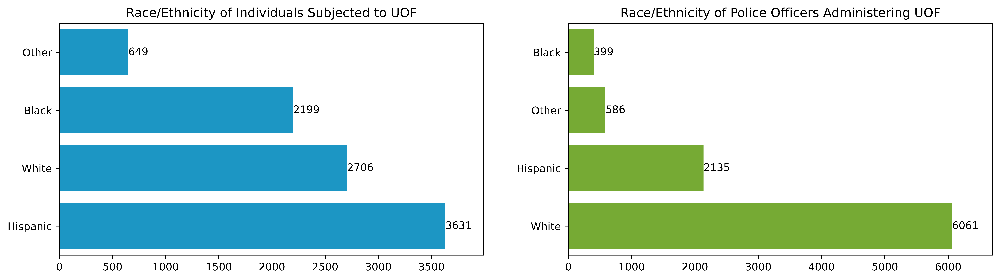

In [28]:
fig, ax = plt.subplots(1, 2, figsize = (16, 4), dpi=900)

temp = eth_sum[['Individual Race/ Ethnicity Grouping', 'Race Ethnicity Count']]
temp['Individual Race/ Ethnicity Grouping'].replace({'Black or African American' : 'Black'}, inplace = True)
temp = temp.groupby(['Individual Race/ Ethnicity Grouping']).sum().sort_values(by=['Race Ethnicity Count'], ascending=True)

sup1 = sns.barplot(temp['Race Ethnicity Count'], orient='h', color=blue, ax = ax[0])
sup1.set(xlabel = None)
sup1.set(ylabel = None)
sup1.set(title = 'Race/Ethnicity of Individuals Subjected to UOF')
sup1.set(xlim = (0, 3990))
sup1.bar_label(sup1.containers[0], fontsize=10)

temp = eth_sum[['Police Employee Race/ Ethnicity Grouping', 'Race Ethnicity Count']]
temp['Police Employee Race/ Ethnicity Grouping'].replace({'Black or African American' : 'Black'}, inplace = True)
temp = temp.groupby(['Police Employee Race/ Ethnicity Grouping']).sum().sort_values(by=['Race Ethnicity Count'], ascending=True)

sup2 = sns.barplot(temp['Race Ethnicity Count'], orient='h', color=green, ax = ax[1])
sup2.set(xlabel=None)
sup2.set(ylabel = None)
sup2.set(title = 'Race/Ethnicity of Police Officers Administering UOF')
sup2.set(xlim = (0, 6700))
sup2.bar_label(sup2.containers[0], fontsize=10)

#fig.suptitle('')
#fig.savefig('Race Counts.png', bbox_inches='tight', pad_inches=.2)
fig.show()

In [29]:
fig, ax = plt.subplots(1, 3, figsize = (16, 5), dpi=900)

sup1 = sns.barplot(y=sum_resistance.values, x=sum_resistance.index, color=blue, ax = ax[0])
sup1.set(xlabel = None)
sup1.set(ylabel = None)
sup1.set(title = 'Individual Resistance Type')
sup1.tick_params(axis='x', rotation=90)
sup1.bar_label(sup1.containers[0], fontsize=8)

sup2 = sns.barplot(y=sum_armed.values, x=sum_armed.index, color=green, ax = ax[1])
sup2.set(xlabel=None)
sup2.set(ylabel = None)
sup2.set(title = 'Individual Armed With')
sup2.tick_params(axis='x', rotation=90)
sup2.bar_label(sup2.containers[0], fontsize=8)

sup3 = sns.barplot(y=sum_uof.values, x=sum_uof.index, color=pink, ax = ax[2])
sup3.set(xlabel=None)
sup3.set(ylabel = None)
sup3.set(title = 'Type of Officer UOF Utilized')
sup3.tick_params(axis='x', rotation=90)
sup3.bar_label(sup3.containers[0], fontsize=7)

#fig.suptitle('')
#fig.savefig('Resistance and UOF.png', bbox_inches='tight', pad_inches=.2)
fig.show()

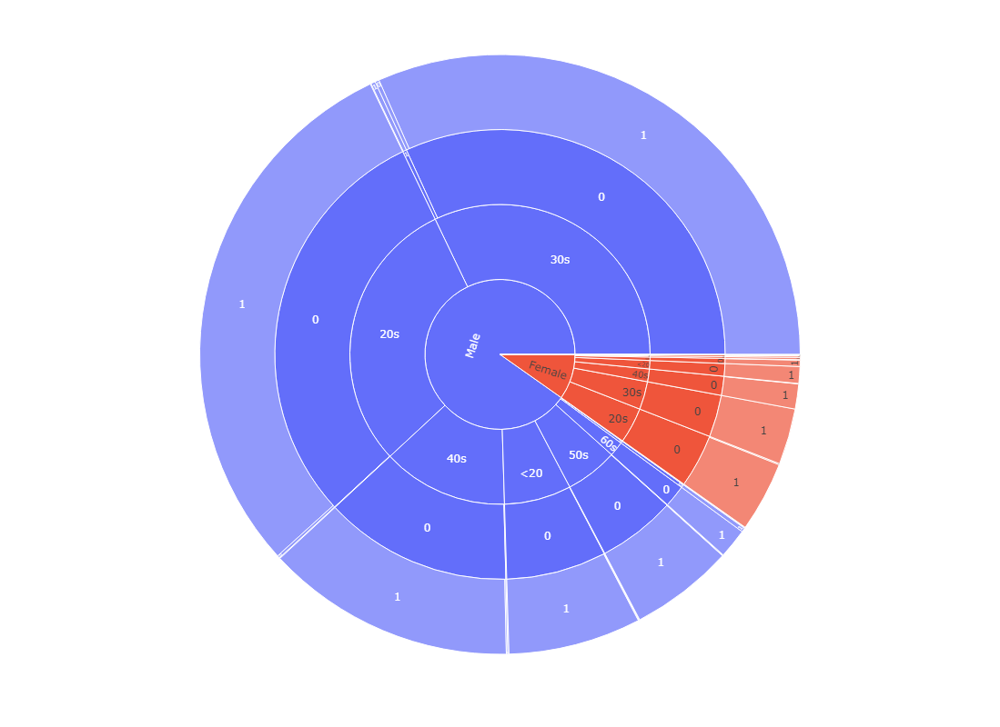

In [30]:
px.sunburst(uof1,
            path=['Individual Gender', 'Individual Age Grouped', 'Use of Force Utilized - Deadly Physical Force', 'Officer Within Policy'],
            #path=['Use of Force Utilized - Deadly Physical Force', 'Officer Within Policy'],
            height=800)

<Axes: ylabel='Police Beat'>

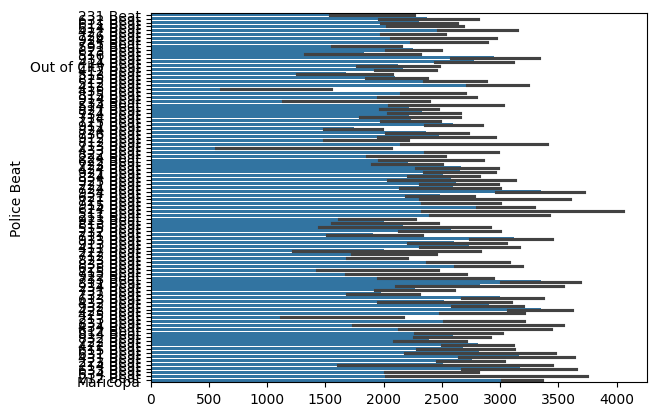

In [31]:
sns.barplot(uof1['Police Beat'])

In [32]:
uof1['Police Beat'].nunique()

94

- A map would better represent this data

<Axes: xlabel='Use of Force Count', ylabel='Police Precinct'>

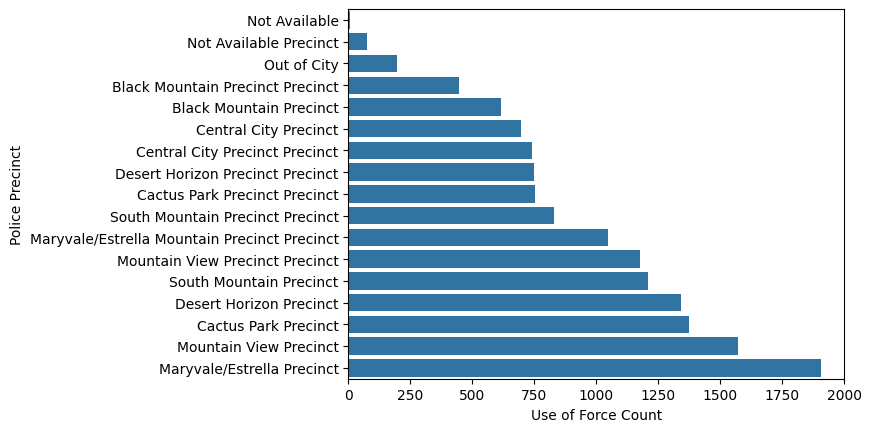

In [33]:
temp = inc_sum[['Police Precinct', 'Use of Force Count']]
temp = temp.groupby(['Police Precinct']).sum().sort_values(by=['Use of Force Count'], ascending=True)
sns.barplot(temp['Use of Force Count'], orient='h')

- A map would be better here as well. Also, 'precinct' is duplicated in some instances.

In [34]:
fig, ax = plt.subplots(2, 3, figsize = (15, 10), dpi=900)
k=0
year = 2018

for i in range(2):
    for j in range(3):
        df = race_dfs[k]
        
        # Set the width of the bars
        barWidth = 0.4
        
        # Set the position of the bars on the x-axis
        r1 = range(len(df))
        r2 = [x + barWidth for x in r1]
        
        # Create the plot
        ax[i,j].bar(r1, df['Officer Proportion'], color=turquoise, width=barWidth, edgecolor=gray4, label='% Total Officers')
        ax[i,j].bar(r2, df['UOF Proportion'], color=pink, width=barWidth, edgecolor=gray4, label='% Total UOF')

        # Add values to the top of each bar
        for x, y1, y2 in zip(r1, df['Officer Proportion'], df['UOF Proportion']):
            ax[i, j].text(x, y1 + 1, str(y1), ha='center', fontsize=7)
            ax[i, j].text(x + barWidth, y2 + 1, str(y2), ha='center', fontsize=7)
                
        # Add xticks on the middle of the group bars
        ax[i,j].set_xticks([r + barWidth/2 for r in range(len(df))])
        ax[i,j].set_xticklabels(df['Officer Race'].values, fontsize=9)
        ax[i,j].set_yticklabels(range(0, 80, 10), fontsize=9)
        ax[i,j].set_ylim(0,77)
        
        # Add a legend and show the plot
        ax[i,j].legend(fontsize=9)
        ax[i,j].set_title(str(year))
        k += 1
        year += 1

fig.suptitle('Race of Phoenix Police Officers as a Percentage of Total Phoenix Officers\nvs.\nForce Used by Each Phoenix Officer Race as a Percentage of Total UOF Instances in Phoenix')
#fig.savefig('Proportion Comparison.png', bbox_inches='tight', pad_inches=.2)
fig.show()

In [35]:
fig, ax = plt.subplots(4, 3, figsize = (12, 16), dpi=900)
k=0

for i in range(4):
    for j in range(3):
        df = df_combined[df_combined['UOF Type'] == sum_uof.index[k]][['Race', 'Individual Difference Proportion', 'Police Difference Proportion']]
        df.set_index('Race', inplace = True)
        df = df.T
        
        # Set the width of the bars
        barWidth = 0.18
        
        # Set the position of the bars on the x-axis
        r1 = range(len(df))
        r2 = [x + barWidth for x in r1]
        r3 = [x + barWidth for x in r2]
        r4 = [x + barWidth for x in r3]
        
        # Create the plot
        ax[i,j].bar(r1, df['White'], color='#0457ac', width=barWidth, edgecolor=gray4, label='White')
        ax[i,j].bar(r2, df['Hispanic'], color='#308fac', width=barWidth, edgecolor=gray4, label='Hispanic')
        ax[i,j].bar(r3, df['Other'], color='#37bd79', width=barWidth, edgecolor=gray4, label='Other')
        ax[i,j].bar(r4, df['Black'], color='#a7e237', width=barWidth, edgecolor=gray4, label='Black')
                
        # Adjust axes settings
        ax[i,j].set_xticks([])
        ax[i,j].set_xticklabels([])
        
        ax[i,j].spines["bottom"].set_position(("data", 0))
        ax[i,j].spines["top"].set_visible(False)
        ax[i,j].spines["right"].set_visible(False)
        
        ax[i,j].text(ax[i,j].get_xlim()[1] * 0.18, ax[i,j].get_ylim()[0] * 1.05, 'Individuals', ha='center', fontsize=10)
        ax[i,j].text(ax[i,j].get_xlim()[1] * 0.75, ax[i,j].get_ylim()[0] * 1.05, 'Police', ha='center', fontsize=10)
        
        # Set title of each plot
        #ax[i,j].legend(fontsize=7)
        ax[i,j].set_title(sum_uof.index[k], fontsize=10)
        
        k += 1

ax[0,0].legend(fontsize=9)

fig.suptitle('Difference in Percentage of UOF Experienced by an Individual\'s Race as a Whole\nand Percentage UOF Experienced by an Individual\'s Race for a Particular UOF Type in Phoenix\n-and-\nDifference in Percentage of UOF Utilized by a Police Officer\'s Race as a Whole\nand Percentage UOF Utilized by a Police Officer\'s Race for a Particular UOF Type in Phoenix\n(Arranged From Most Frequently Utilized UOF to Least)', fontsize=10)
#fig.savefig('UOF Percentage Variations.png', bbox_inches='tight', pad_inches=.2)
fig.show()

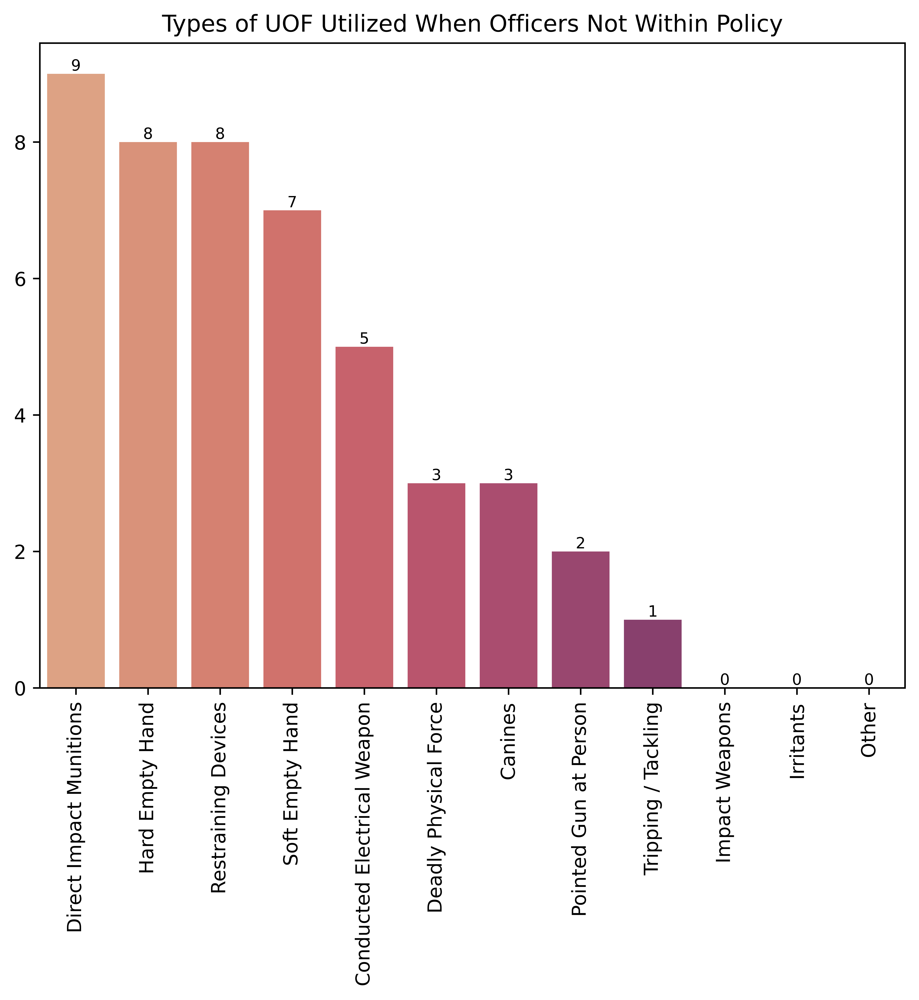

In [36]:
fig, ax = plt.subplots(1, 1, figsize = (8, 6), dpi=900)

oop1 = sns.barplot(y=sum_oop.values, x=sum_oop.index, palette='flare', ax=ax)
oop1.set(xlabel=None)
oop1.set(ylabel = None)
oop1.set(title = 'Types of UOF Utilized When Officers Not Within Policy')
oop1.tick_params(axis='x', rotation=90)
for i in range(len(sum_oop)):
    oop1.bar_label(oop1.containers[i], fontsize=8)

#fig.savefig('UOF Not In Policy.png', bbox_inches='tight', pad_inches=.2)
fig.show()

In [37]:
len(uof1[uof1['Officer Within Policy'] == 0])

35

In [38]:
len(uof1[uof1['Officer Within Policy'] == 1])

4932

## Methodology

In [39]:
methodology = uof1.copy() # where uof1 is the primary uof dataset (uof incident details)
methodology['UOF Ordinal'] = 0
methodology['UOF Severity'] = 0
methodology['Ordinal Avg'] = 0

uof_cols = ['Use of Force Utilized - Other',
            'Use of Force Utilized - Restraining Devices',
            'Use of Force Utilized - Soft Empty Hand',
            'Use of Force Utilized - Tripping / Tackling',
            'Use of Force Utilized - Pointed Gun at Person',
            'Use of Force Utilized - Irritants',
            'Use of Force Utilized - Conducted Electrical Weapon (CEW)',
            'Use of Force Utilized - Hard Empty Hand',
            'Use of Force Utilized - Impact Weapons',
            'Use of Force Utilized – Direct Impact Munitions',
            'Use of Force Utilized - Canines',
            'Use of Force Utilized - Deadly Physical Force']

for i in range(0, len(methodology)):
    j = 0
    k = 0
    for col in uof_cols:
        if j < 7:
            k = 0
        else:
            k = 1
        if methodology.iloc[i][col] == 1:
            methodology.at[i, 'UOF Ordinal'] = j
            methodology.at[i, 'UOF Severity'] = k
        j += 1

for precinct in methodology['Police Precinct'].unique():
    df = methodology[methodology['Police Precinct'] == precinct]
    ord_avg = df['UOF Ordinal'].mean()
    methodology.loc[methodology['Police Precinct'] == precinct, 'Ordinal Avg'] = ord_avg

In [40]:
methodology

,Use of Force Report Number,Incident Report Number,Police Employee Unique Identifier,Unique Individual Record Number,Date,Year,Hour,Day of Week,Police Beat,Anonymized Address,...,Use of Force Utilized - Conducted Electrical Weapon (CEW),Use of Force Utilized - Irritants,Use of Force Utilized - Pointed Gun at Person,Use of Force Utilized - Tripping / Tackling,Use of Force Utilized - Soft Empty Hand,Use of Force Utilized - Restraining Devices,Use of Force Utilized - Other,UOF Ordinal,UOF Severity,Ordinal Avg
0,UOF21-0004,202100000009233,09947,24794,2021-01-02T00:00:00,2021,17,7-SATURDAY,231 Beat,1XXXX North 15th Street,...,0,0,0,0,0,1,0,1,0,4.213904
1,UOF21-0018,202100000010086,R1425,24793,2021-01-02T00:00:00,2021,20,7-SATURDAY,632 Beat,3XXX East Bell Road,...,0,0,0,0,0,1,0,1,0,4.151163
2,UOF21-0018,202100000010086,10402,24793,2021-01-02T00:00:00,2021,20,7-SATURDAY,632 Beat,3XXX East Bell Road,...,0,0,0,0,0,1,0,1,0,4.151163
3,UOF21-0004,202100000009233,10347,24794,2021-01-02T00:00:00,2021,17,7-SATURDAY,231 Beat,1XXXX North 15th Street,...,0,0,0,0,0,1,0,1,0,4.213904
4,UOF21-0013,202100000011222,07553,24772,2021-01-03T00:00:00,2021,1,1-SUNDAY,611 Beat,1XXX West Glendale Avenue,...,0,0,0,0,0,1,0,1,0,4.151163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,RTR23-1443,202300001661876,09366,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,0,0,0,0,0,0,0,9,1,5.392752
4963,RTR23-1443,202300001661876,09902,49296,2023-11-02T00:00:00,2023,16,5-THURSDAY,815 Beat,7XXX West Thomas Road,...,0,0,0,1,0,0,0,3,0,5.392752
4964,RTR23-1319,202300001662882,10628,49272,2023-11-02T00:00:00,2023,18,5-THURSDAY,932 Beat,1XXXX North 28th Avenue,...,0,0,0,0,0,0,0,9,1,4.696341
4965,RTR23-1372,202300001668249,11720,49412,2023-11-03T00:00:00,2023,16,6-FRIDAY,422 Beat,4XXX South 9th Street,...,0,0,0,1,0,0,0,3,0,4.552670


In [41]:
methodology[['Police Precinct', 'Ordinal Avg']].value_counts()

Police Precinct             Ordinal Avg
Maryvale/Estrella Precinct  5.392752       1021
Mountain View Precinct      4.679590        877
Cactus Park Precinct        4.696341        820
Desert Horizon Precinct     4.151163        774
South Mountain Precinct     4.552670        693
Black Mountain Precinct     4.213904        374
Central City Precinct       4.910891        303
Out of City                 5.019048        105
Name: count, dtype: int64

In [42]:
methodology['UOF Ordinal'].value_counts()

UOF Ordinal
2     1420
7      952
3      796
9      704
6      488
1      308
4      116
10     108
5       27
11      23
0       22
8        3
Name: count, dtype: int64

In [43]:
methodology['UOF Severity'].value_counts()

UOF Severity
0    3177
1    1790
Name: count, dtype: int64

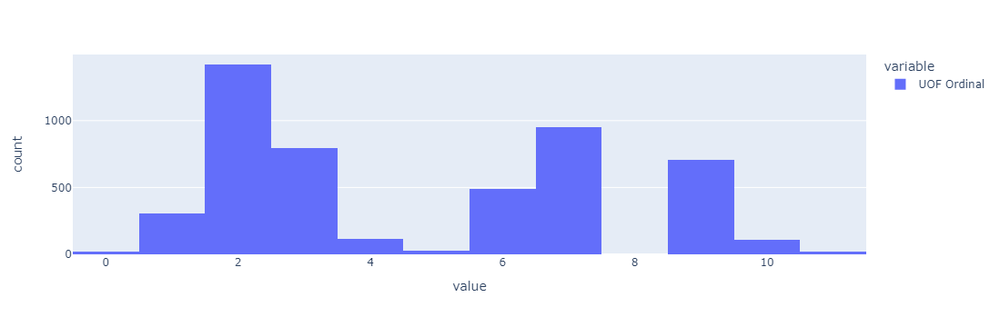

In [44]:
px.histogram(methodology['UOF Ordinal'])

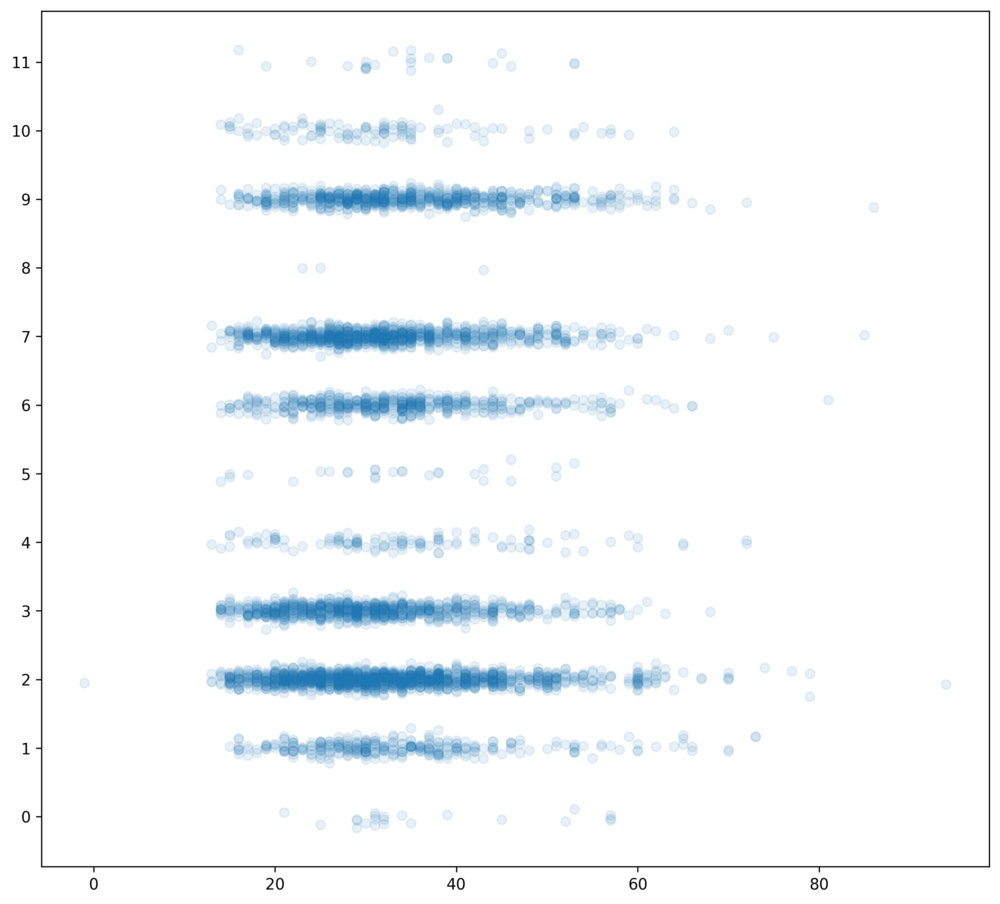

In [45]:
plt.figure(figsize=(11, 10), dpi=300)
plt.scatter(x=methodology['Individual Age'], y=methodology['UOF Ordinal'] + np.random.normal(0,0.08,4967), alpha=0.1)
plt.yticks(range(0,12))
plt.show()

In [46]:
race_concat

,Officer Race,SWORN_COUNT,Race Ethnicity Count,Officer Proportion,UOF Proportion,Year
3,White,2105,795,72.69,72.34,2018
1,Hispanic,510,198,17.61,18.02,2018
2,Other,161,70,5.56,6.37,2018
0,Black,120,36,4.14,3.28,2018
3,White,2134,799,71.56,65.98,2019
1,Hispanic,559,298,18.75,24.61,2019
2,Other,162,75,5.43,6.19,2019
0,Black,127,39,4.26,3.22,2019
3,White,2119,923,71.01,66.50,2020
1,Hispanic,570,307,19.10,22.12,2020


In [47]:
race_concat.describe()

,SWORN_COUNT,Race Ethnicity Count,Officer Proportion,UOF Proportion,Year
count,24.000000,24.000000,24.00000,24.000000,24.000000
mean,722.625000,382.500000,25.00000,25.000833,2020.500000
std,801.647641,405.229296,27.61984,25.663219,1.744557
min,119.000000,36.000000,4.14000,3.220000,2018.000000
25%,143.500000,81.000000,5.23250,5.777500,2019.000000
50%,342.500000,171.000000,11.67500,12.455000,2020.500000
75%,883.750000,584.250000,32.88000,34.945000,2022.000000
max,2146.000000,1349.000000,72.69000,72.340000,2023.000000


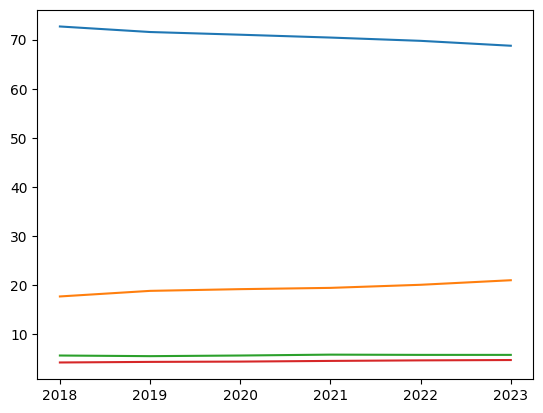

In [48]:
plt.plot(race_concat[race_concat['Officer Race'] == 'White']['Year'], race_concat[race_concat['Officer Race'] == 'White']['Officer Proportion'])
plt.plot(race_concat[race_concat['Officer Race'] == 'Hispanic']['Year'], race_concat[race_concat['Officer Race'] == 'Hispanic']['Officer Proportion'])
plt.plot(race_concat[race_concat['Officer Race'] == 'Other']['Year'], race_concat[race_concat['Officer Race'] == 'Other']['Officer Proportion'])
plt.plot(race_concat[race_concat['Officer Race'] == 'Black']['Year'], race_concat[race_concat['Officer Race'] == 'Black']['Officer Proportion'])

In [49]:
stats.ttest_ind(race_concat[race_concat['Officer Race'] == 'White']['Officer Proportion'],
                race_concat[race_concat['Officer Race'] == 'White']['UOF Proportion'])

TtestResult(statistic=2.9051181881377697, pvalue=0.015695402959508296, df=10.0)

In [50]:
stats.ttest_ind(race_concat[race_concat['Officer Race'] == 'Hispanic']['Officer Proportion'],
                race_concat[race_concat['Officer Race'] == 'Hispanic']['UOF Proportion'])

TtestResult(statistic=-2.9222876763686636, pvalue=0.015240662078708592, df=10.0)

In [51]:
stats.ttest_ind(race_concat[race_concat['Officer Race'] == 'Other']['Officer Proportion'],
                race_concat[race_concat['Officer Race'] == 'Other']['UOF Proportion'])

TtestResult(statistic=-4.6148434122709485, pvalue=0.0009581094587603791, df=10.0)

In [52]:
stats.ttest_ind(race_concat[race_concat['Officer Race'] == 'Black']['Officer Proportion'],
                race_concat[race_concat['Officer Race'] == 'Black']['UOF Proportion'])

TtestResult(statistic=0.40522822282698984, pvalue=0.6938431012595802, df=10.0)

In [53]:
race_breakout = pd.DataFrame(methodology[['Police Employee Race / Ethnicity Grouping', 'Individual Race / Ethnicity Grouping']].value_counts().reset_index())
race_breakout.sort_values(by='Police Employee Race / Ethnicity Grouping', ascending=False, inplace=True)
race_breakout.reset_index(drop=True, inplace=True)
race_breakout.replace({'Black or African American' : 'Black'}, inplace=True)
race_breakout

,Police Employee Race / Ethnicity Grouping,Individual Race / Ethnicity Grouping,count
0,White,Hispanic,1225
1,White,White,956
2,White,Black,813
3,White,Other,223
4,Other,Hispanic,143
5,Other,Black,87
6,Other,White,85
7,Other,Other,16
8,Hispanic,Hispanic,515
9,Hispanic,Black,295


In [54]:
race_breakout['Force Proportion'] = [70.70, 70.70, 70.70, 70.70, 5.61, 5.61, 5.61, 5.61, 19.29, 19.29, 19.29, 19.29, 4.40, 4.40, 4.40, 4.40]
race_breakout['Proportion UOF'] = [66.54, 66.54, 66.54, 66.54, 6.37, 6.37, 6.37, 6.37, 22.85, 22.85, 22.85, 22.85, 4.23, 4.23, 4.23, 4.23]
race_breakout['Proportion of Ind Race'] = [61.87, 69.48, 63.92, 65.78, 7.22, 6.84, 6.18, 4.72, 26.01, 23.19, 21.22, 24.78, 4.90, 6.05, 3.13, 4.72]

In [55]:
race_breakout

,Police Employee Race / Ethnicity Grouping,Individual Race / Ethnicity Grouping,count,Force Proportion,Proportion UOF,Proportion of Ind Race
0,White,Hispanic,1225,70.70,66.54,61.87
1,White,White,956,70.70,66.54,69.48
2,White,Black,813,70.70,66.54,63.92
3,White,Other,223,70.70,66.54,65.78
4,Other,Hispanic,143,5.61,6.37,7.22
5,Other,Black,87,5.61,6.37,6.84
6,Other,White,85,5.61,6.37,6.18
7,Other,Other,16,5.61,6.37,4.72
8,Hispanic,Hispanic,515,19.29,22.85,26.01
9,Hispanic,Black,295,19.29,22.85,23.19


In [56]:
output = methodology[[
'Day of Week',
'Police Beat',
'Police Precinct',
'Individual Gender',
'Individual Age Grouped',
'Individual Race / Ethnicity Grouping',
'Police Employee Race / Ethnicity Grouping',
'Police Employee Gender / Sex',
'Individual Resistance - Aggravated Active Aggression',
'Individual Resistance -Active Aggression',
'Individual Resistance -Active Resistance',
'Individual Resistance -Passive Resistance',
'Individual Resistance -Psychological Intimidation',
'Individual Resistance -Verbal Non Compliance',
'Individual Resistance - None',
'Individual Armed With -Gun',
'Individual Armed with - Cutting Instrument',
'Individual Armed With - Blunt Instrument',
'Individual Armed With - Bodily Force',
'Individual Armed With - Other',
'Individual Armed With - No Weapon',
'Individual Charged With - Criminal Felony',
'Individual Charged With - Criminal Misdemeanor',
'Individual Charged With - Criminal Traffic',
'Individual Charged With - Civil Traffic',
'Individual Charged With - None',
'Officer Body Worn Camera Active',
'Use of Force Utilized - Deadly Physical Force',
'Use of Force Utilized - Canines',
'Use of Force Utilized - Impact Weapons',
'Use of Force Utilized - Hard Empty Hand',
'Use of Force Utilized – Direct Impact Munitions',
'Use of Force Utilized - Conducted Electrical Weapon (CEW)',
'Use of Force Utilized - Irritants',
'Use of Force Utilized - Pointed Gun at Person',
'Use of Force Utilized - Tripping / Tackling',
'Use of Force Utilized - Soft Empty Hand',
'Use of Force Utilized - Restraining Devices',
'Use of Force Utilized - Other',
'UOF Severity']]

In [57]:
#output.to_csv('UOF SAS.csv', index=False)

In [58]:
X = methodology[[
'Day of Week',
'Police Beat',
'Police Precinct',
'Individual Gender',
'Individual Age Grouped',
'Individual Race / Ethnicity Grouping',
'Police Employee Race / Ethnicity Grouping',
'Police Employee Gender / Sex',
'Individual Resistance - Aggravated Active Aggression',
'Individual Resistance -Active Aggression',
'Individual Resistance -Active Resistance',
'Individual Resistance -Passive Resistance',
'Individual Resistance -Psychological Intimidation',
'Individual Resistance -Verbal Non Compliance',
'Individual Resistance - None',
'Individual Armed With -Gun',
'Individual Armed with - Cutting Instrument',
'Individual Armed With - Blunt Instrument',
'Individual Armed With - Bodily Force',
'Individual Armed With - Other',
'Individual Armed With - No Weapon',
'Individual Charged With - Criminal Felony',
'Individual Charged With - Criminal Misdemeanor',
'Individual Charged With - Criminal Traffic',
'Individual Charged With - Civil Traffic',
'Individual Charged With - None',
'Officer Body Worn Camera Active']]

y = methodology['UOF Severity']

In [59]:
categorical_data = X.loc[:, 'Day of Week':'Police Employee Gender / Sex']

encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

encoded_data = encoder.fit_transform(categorical_data)

encoded_column_names = encoder.get_feature_names_out(categorical_data.columns)

encoded_df = pd.DataFrame(encoded_data, columns=encoded_column_names)

encoded_df

,Day of Week_1-SUNDAY,Day of Week_2-MONDAY,Day of Week_3-TUESDAY,Day of Week_4-WEDNESSDAY,Day of Week_5-THURSDAY,Day of Week_6-FRIDAY,Day of Week_7-SATURDAY,Police Beat_211 Beat,Police Beat_212 Beat,Police Beat_213 Beat,...,Individual Race / Ethnicity Grouping_Black or African American,Individual Race / Ethnicity Grouping_Hispanic,Individual Race / Ethnicity Grouping_Other,Individual Race / Ethnicity Grouping_White,Police Employee Race / Ethnicity Grouping_Black or African American,Police Employee Race / Ethnicity Grouping_Hispanic,Police Employee Race / Ethnicity Grouping_Other,Police Employee Race / Ethnicity Grouping_White,Police Employee Gender / Sex_Female,Police Employee Gender / Sex_Male
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4963,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4964,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4965,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [60]:
X1 = X[['Individual Resistance - Aggravated Active Aggression',
'Individual Resistance -Active Aggression',
'Individual Resistance -Active Resistance',
'Individual Resistance -Passive Resistance',
'Individual Resistance -Psychological Intimidation',
'Individual Resistance -Verbal Non Compliance',
'Individual Resistance - None',
'Individual Armed With -Gun',
'Individual Armed with - Cutting Instrument',
'Individual Armed With - Blunt Instrument',
'Individual Armed With - Bodily Force',
'Individual Armed With - Other',
'Individual Armed With - No Weapon',
'Individual Charged With - Criminal Felony',
'Individual Charged With - Criminal Misdemeanor',
'Individual Charged With - Criminal Traffic',
'Individual Charged With - Civil Traffic',
'Individual Charged With - None',
'Officer Body Worn Camera Active']]

In [61]:
X_prepared = pd.concat([X1, encoded_df], axis=1)
X_prepared

,Individual Resistance - Aggravated Active Aggression,Individual Resistance -Active Aggression,Individual Resistance -Active Resistance,Individual Resistance -Passive Resistance,Individual Resistance -Psychological Intimidation,Individual Resistance -Verbal Non Compliance,Individual Resistance - None,Individual Armed With -Gun,Individual Armed with - Cutting Instrument,Individual Armed With - Blunt Instrument,...,Individual Race / Ethnicity Grouping_Black or African American,Individual Race / Ethnicity Grouping_Hispanic,Individual Race / Ethnicity Grouping_Other,Individual Race / Ethnicity Grouping_White,Police Employee Race / Ethnicity Grouping_Black or African American,Police Employee Race / Ethnicity Grouping_Hispanic,Police Employee Race / Ethnicity Grouping_Other,Police Employee Race / Ethnicity Grouping_White,Police Employee Gender / Sex_Female,Police Employee Gender / Sex_Male
0,0,0,0,1,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0,0,1,0,1,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0,0,1,0,1,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,0,0,0,1,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
4,0,1,1,0,0,1,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,0,1,1,1,1,1,0,0,1,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4963,0,1,1,1,1,1,0,0,1,0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4964,0,0,1,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4965,0,0,1,1,0,1,0,0,0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [62]:
X_train, X_test, y_train, y_test = train_test_split(X_prepared, y, test_size=.2, random_state=42)

In [63]:
lr = LogisticRegression()

In [64]:
poly_lr_clf = make_pipeline(PolynomialFeatures(degree=3),
                            StandardScaler(),
                            LogisticRegression(C=10))

voting_clf = VotingClassifier(voting='soft',
    estimators=[
        ('lr', LogisticRegression()),
        ('knn', KNeighborsClassifier(n_neighbors=5)),
        ('rf', RandomForestClassifier(random_state=42)),
        ('svc', SVC(probability=True, random_state=42))])

voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42))],
                 voting='soft')

In [65]:
voting_clf.score(X_test, y_test)

0.7062374245472837

In [66]:
for name, clf in voting_clf.named_estimators_.items():
    print(name, ' = ', clf.score(X_test, y_test))

lr  =  0.6770623742454729
knn  =  0.6639839034205232
rf  =  0.7072434607645876
svc  =  0.7032193158953722


*************************************************************************************************************************

Model: LogisticRegression() 

Accuracy: 0.677062; Precision: 0.541284; Recall: 0.348083

Confusion Matrix:
 [[555 100]
 [221 118]] 



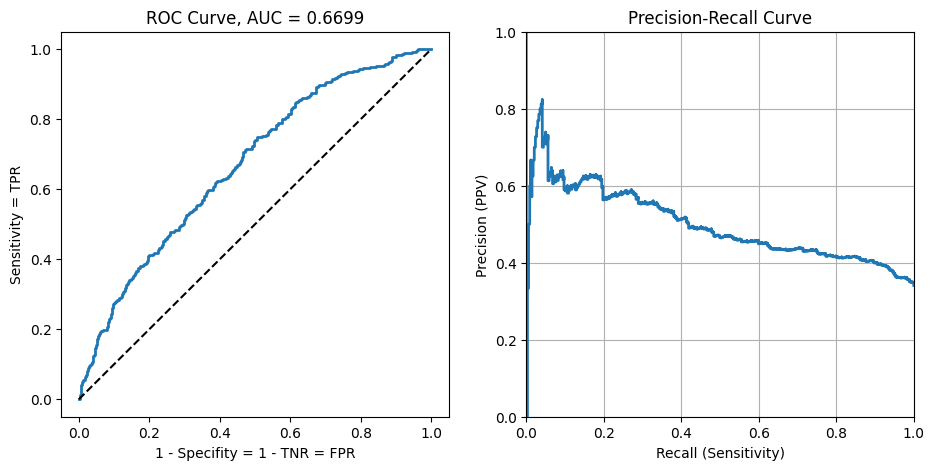

*************************************************************************************************************************

Model: VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42))],
                 voting='soft') 

Accuracy: 0.706237; Precision: 0.609302; Recall: 0.386431

Confusion Matrix:
 [[571  84]
 [208 131]] 



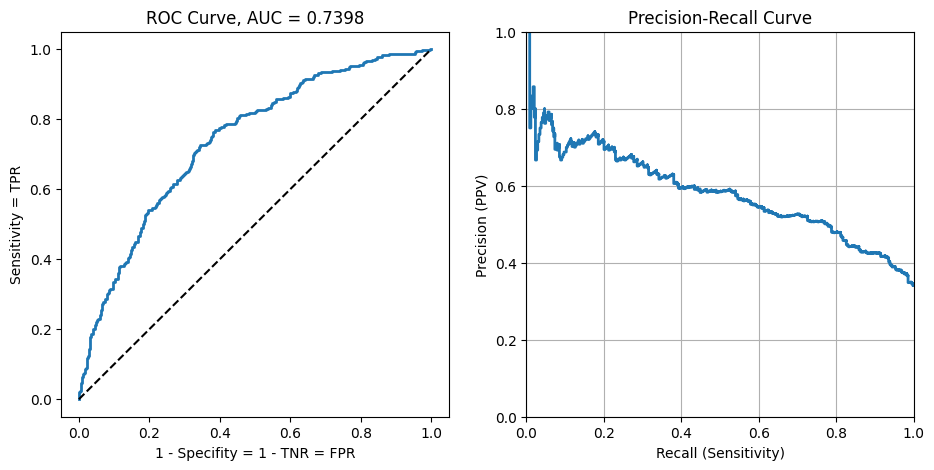

*************************************************************************************************************************



In [67]:
model_evaluation([lr, voting_clf], X_train, y_train, X_test, y_test)

In [68]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(sev_1hot.drop(columns="'Use of Force Utilized' Severity"), sev_1hot["'Use of Force Utilized' Severity"], test_size=.1, random_state=42)

In [69]:
voting_clf2 = VotingClassifier(voting='soft',
    estimators=[
        ('lr', LogisticRegression()),
        ('knn', KNeighborsClassifier(n_neighbors=8)),
        ('rf', RandomForestClassifier(random_state=42)),
        ('svc', SVC(probability=True, random_state=42))])

voting_clf2.fit(X_train2, y_train2)

VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('knn', KNeighborsClassifier(n_neighbors=8)),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42))],
                 voting='soft')

In [70]:
voting_clf2.score(X_test2, y_test2)

0.7393162393162394

In [71]:
for name, clf in voting_clf2.named_estimators_.items():
    print(name, ' = ', clf.score(X_test2, y_test2))

lr  =  0.717948717948718
knn  =  0.6538461538461539
rf  =  0.7521367521367521
svc  =  0.7478632478632479


*************************************************************************************************************************

Model: LogisticRegression() 

Accuracy: 0.717949; Precision: 0.704762; Recall: 0.678899

Confusion Matrix:
 [[94 31]
 [35 74]] 



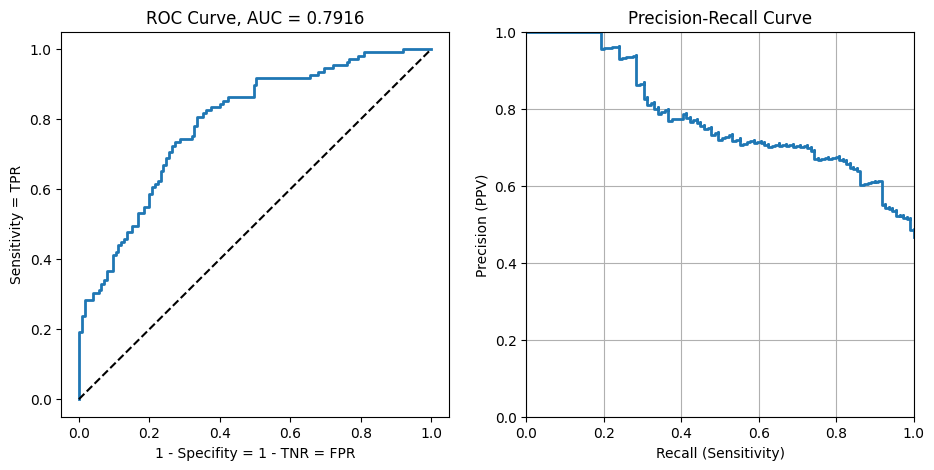

*************************************************************************************************************************

Model: VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('knn', KNeighborsClassifier(n_neighbors=8)),
                             ('rf', RandomForestClassifier(random_state=42)),
                             ('svc', SVC(probability=True, random_state=42))],
                 voting='soft') 

Accuracy: 0.739316; Precision: 0.735294; Recall: 0.688073

Confusion Matrix:
 [[98 27]
 [34 75]] 



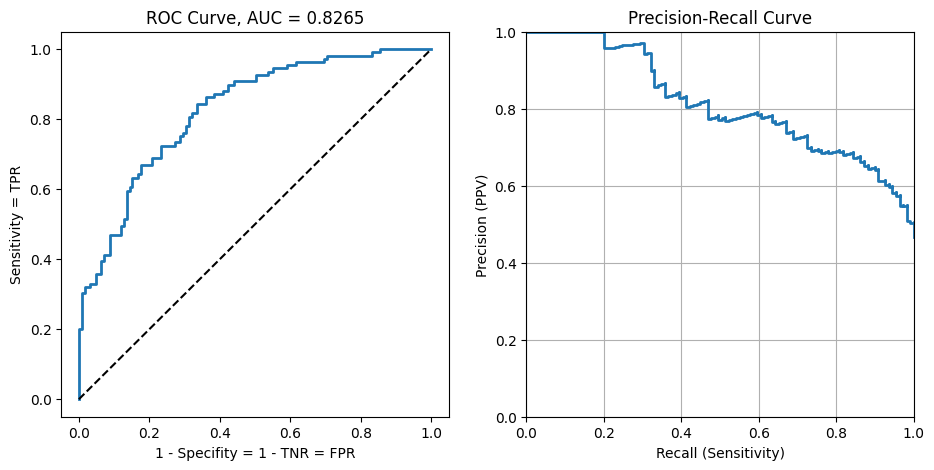

*************************************************************************************************************************



In [72]:
model_evaluation([lr, voting_clf2], X_train2, y_train2, X_test2, y_test2)